## **Условие задачи**

**Дано:**
- пластина, в которой распространяется тепло от нескольких источников
  
- коэффициенты диффузии:
    -  основного материала (синий цвет) $D_0 = 1.0$
    -  включений (белый цвет) $D_1 = 10^{-2}$

- размер массива поля температур $NxN$, где $N \in [60, 120, 240, 480, 960]$

- $T_0 = 0$ - начальная температура во всем объеме пластины

- граничные условия на ребрах пластины двух видов:
    - фиксированная температура на ребрах
        - $x = 0$
        - $y = 0$
    - абсолютная теплоизоляция на ребрах   **(Важно, что вот отсюда я делаю вывод, что L = 60 - это длина пластины)**
        - $x = 60$         
        - $y = 60$         

- в массе пластины расположены источники тепла, мощность которых меняется по периодическому закону:
    -  $\dot{q}_i = p_i \cdot (sin(\frac{2\pi}{\theta_i}t) + 1)$
    - источник 0: $p_0 = 100$, $\theta_0 = 43$
    - источник 1: $p_1 = 100$, $\theta_1 = 77$
    
- на пластине расположены 4 пробы (черные точки)
    
- $t_m = 600$ c - общее время моделирования

**Пример схемы пластины для варианта 0**

<img src="var_00.png" width=600/>


**Требуется:**
- согласно уравнению диффузии смоделировать распространение тепла в пластине на заданное время $t_m$ для каждого $N$
- шаг по времени $dt$ подобрать самостоятельно так, чтобы расчетная схема сходилась
- для каждого $N$:
    1. вывести время расчета
    
    2. сохранить в файл(ы) и использовать в пунктах 3-5:
        - температурное поле в конечный момент времени
        - замеры температуры в местах установки проб
        - **сохраненные файлы НЕ загружать в классрум**
    
    3. построить изображение матрицы коэффициентов диффузии

    4. построить цветовую карту поля температур в конечный момент времени
        - подписать оси,
        - отобразить цветовую шкалу `colorbar`,
        - отобразить пробы в виде точек и подписать их номера.

    5. на одном рисунке построить графики температур в местах установки всех четырех проб
        - подписать оси,
        - вывести легенду.

    6. используя быстрое преобразование Фурье, восстановить периоды колебаний температуры в местах установки проб
        - `np.fft.rfft`, `np.fft.rfftfreq`, `scipy.signal.find_peaks`

    7. задокументировать все функции


**Материалы:**

- [Уравнение теплопроводности](https://ru.wikipedia.org/wiki/Уравнение_теплопроводности)
- [Solving 2D heat equation numerically using python](https://levelup.gitconnected.com/solving-2d-heat-equation-numerically-using-python-3334004aa01a)
- [Diffusion Eq 2D with Source](https://www.youtube.com/watch?v=aCRYfvh_bnY)


**Правила оценивания:**

- оценка за корректно выполненный расчет для $N$, баллов из 100:
```
    N    =   60,  120, 240, 480, 960
    g(N) =    5,    5,  10,  30,  50
```
    
- штрафы $p(i)$, баллов:
    - не выведено время расчета - 20
    - не выполнено сохранение результатов в файл(ы) - 20
    - построение графиков не использует сохраненные результаты - 20
    - не построены графики температур в местах установки проб - 20
    - не построена карта поля температур - 20
    - не построена карта коэффициентов диффузии - 10
    - не посчитаны периоды колебаний - 20
    - отсутствует документация функций - 20
    - менее значимые недоработки - 10


- итоговая оценка за задание = $\sum_{k=1}^{4}{g(N_k)} - \sum_{i}{p(i)}$


## **Вариант №14**

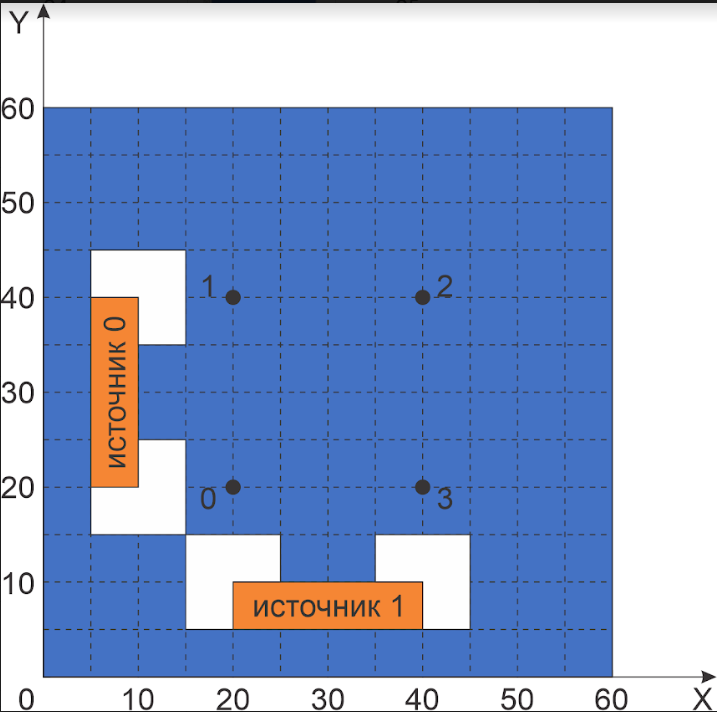

Временной шаг $dt$ должен быть таким, чтобы учитывать условие Курранта: $dt \leq \frac{C \cdot dx^2}{D_{max}}$, где $C$ - число Курранта.

Я возьму C=0.3

Dmax =  max(1, 1e-2) = 1

$dt \leq \frac{C \cdot dx^2}{D_{max}}$

$dt \leq 0.3*{dx^2}$

dx = L/N

Все будет работать

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import holoviews as hv

#from scipy.interpolate import interp1d
from numba import njit, jit, prange
from tqdm import trange
from timeit import timeit
from scipy.signal import find_peaks
from holoviews import dim, opts

In [ ]:
D_base = 1 # Коэффициент диффузии пластины
D_add = 1e-2 # Коэффициент диффузии материала включений

p=100 # параметры источников тепла №0 и №1
theta=np.array([43,77]) # параметры источников тепла №0 и №1
N_arr = np.array([60,120,240,480,960]) # сторона пластины

L = 60 # Очень важный момент, к которому я пришла не сразу... Но он важен

In [ ]:
@njit(parallel=True) # Для уменьшения времени выполнения программы, сделаю распараллеливание
def diffuse_step(it, T, Dxy, dt, dx):
    """
    Функция рассчитывает температуру в текущий момент времени относительно предыдущего шага.
    мы храним только два массива, а не все состояния температурной карты

    Параметры:
    ti: int;            номер итерации
    T: numpy.ndarray;   массив температур, распределенных по пластине
    Dxy: numpy.ndarray; массив коэфицентов диффузии
    dt: float;          шаг по времени

    Возвращаемое значение:
    функция ничего не возвращает
    """
    it = it % 2 # Воспользуемся формулой с семинара
    it_j = (it + 1) % 2
    for i in prange(1, T.shape[1]-1):          # это параллелим
        for j in prange(1, T.shape[1]-1):
            g = dt * Dxy[i, j] / dx**2
            T[it_j, i, j] = T[it, i, j] + \
                          g * (T[it, i+1, j] +
                               T[it, i-1, j] +
                               T[it, i, j+1] +
                               T[it, i, j-1] -
                               4*T[it, i, j])

In [ ]:
def boundary_condition_isolation(T):
    """
    Функция применяет условие абсолютной теплоизоляции к границам, то есть задает значения
    в последней строке и в последнем столбце равными значениям
    в предпоследней строке и в предпоследнем столбце соответственно.
    (Градиент на крайних точках = 0)

    Параметры:
    T: numpy.ndarray; массив температур, распределенных по пластине

    Возвращаемое значение:
    функция ничего не возвращает
    """
    T[:,-1,:]=T[:,-2,:]
    T[:,:,-1]=T[:,:,-2]

In [ ]:
def source_power(it, dt, num_s):
    """
    Функция рассчитывает мощность источников по формуле из условия

    Параметры:
    it: int;      номер итерации
    dt: float;    шаг по времени
    num_s: int;   номер источника

    Возвращаемое значение:
    float; мощность источника
    """
    return p*(np.sin(2*np.pi *it*dt/theta[num_s])+1)

In [ ]:
def source_temperature(it, T, dt, center, dimension, num_s):
    """
    Функция рассчитывает температуру источников на данной итерации.

    Параметры:
    it: int;                  номер итерации
    T: numpy.ndarray;         массив температур, распределенных по пластине
    dt: float;                шаг по времени
    center: [int, int];       позиция источника. Массив [координата по х, координата  по у]
    dimentions: [int, int];   размер источника.  Массив [длина, ширина]
    num_s: int;               номер источника (0 или 1)

    Возвращаемое значение:
    функция ничего не возвращает
    """
    temp = it % 2
    bottom = center[0] - dimension[0] // 2 # Рассчитываем геометрическое место источника как центр +- его размеры
    top = center[0] + dimension[0] // 2
    left = center[1] - dimension[1] // 2
    right = center[1] + dimension[1]  // 2

    T[temp, bottom:top, left:right] += dt*source_power(it, dt, num_s)

In [ ]:
def main_function(N, dt):
    """
    Функция задает начальные коэффициенты диффузии на пластине, в зависимости от расположения
    вставочных деталей. Затем, в зависимости от требуемого разбиения по времени dt
    происходит пошаговый "нагрев" пластины источниками.
    - подсчитывается температура каждого источника на каждом шаге
    - производится диффузный шаг
    - применяются граничные условия
    В процессе выполнения функции, заполняется температурная карта при заданных граничных условиях.

    Параметры:
    N: int;     размерность пластины
    dt: float;  шаг по времени

    Возвращаемое значение:
    функция ничего не возвращает
    """

    Dxy = np.full((N,N), D_base, dtype=float) # массив коэффициентов диффузии размера N*N. Изначально заполянем их значением D_base
    T = np.zeros((2,N,N),dtype=float) # Изначально температура во всех точках пластины = 0
    it = int(600/dt) # количество итераций равна = (общее время 600с)/(размер временного шага dt, который мы хотим рассматривать)

    center = np.array([ N/2, N/8], dtype=int)  # координата одного из источников
    dimension = np.array([N/3,N/12], dtype=int)  # Размертого же источника.
                                            # т.к. они располоены зеркально относ. y=x, то мы потом используем те же значения
                                            # но поменяем x и y местами


    # Задаем поочередно все части вставок, разбивая их на прямоугольники
    # В месте вставок коэффициент диффузии будет равен коэффициенту диффузии вставочного материала
    Dxy[N // 4 : N //3, N // 12 : N // 6] = D_add
    Dxy[N *2// 3 : N*3 //4, N // 12 : N // 6] = D_add
    Dxy[N // 12 : N // 6, N *2// 3 : N*3 //4] = D_add
    Dxy[N // 12 : N // 6, N // 4 : N //3] = D_add

    Dxy[N // 4 : N*5 // 12, N // 6 : N //4] = D_add
    Dxy[N // 6 : N //4, N // 4 : N*5 // 12] = D_add
    Dxy[N*7 // 12 : N*3 // 4, N // 6 : N //4] = D_add
    Dxy[N // 6 : N //4,N*7 // 12 : N*3 // 4] = D_add


    # Задаем координаты приборов/проб (мест, откуда будет браться "проба" температуры)
    probe_0 = np.array([N/3, N/3], dtype=int)
    probe_1 = np.array([0.3*N, 2*N/3], dtype=int)
    probe_2 = np.array([2*N/3, 2*N/3], dtype=int)
    probe_3 = np.array([2*N/3, N/3], dtype=int)

    # Массивы для сохранения информации о температуре в каждом из приборов
    T_probe_0 = np.zeros(it, dtype=float)
    T_probe_1 = np.zeros(it, dtype=float)
    T_probe_2 = np.zeros(it, dtype=float)
    T_probe_3 = np.zeros(it, dtype=float)

    dx = L/N

    for t in trange(it):
        source_temperature(t, T, dt, center, dimension, 0) # Источник №0 мы берем с заданными значениями
        source_temperature(t, T, dt, center[::-1], dimension[::-1], 1) # для источника №1 меняем значения координат центра местами и значения размеров длина/ширина
        diffuse_step(t, T, Dxy, dt, dx)
        boundary_condition_isolation(T)

        ti = (t+1) % 2
        T_probe_0[t] = T[ti, probe_0[1], probe_0[0]]
        T_probe_1[t] = T[ti, probe_1[1], probe_1[0]]
        T_probe_2[t] = T[ti, probe_2[1], probe_2[0]]
        T_probe_3[t] = T[ti, probe_3[1], probe_3[0]]

    temperature_arr = np.array([T_probe_0, T_probe_1, T_probe_2, T_probe_3]) # Будем хранить в одном массиве информацию о температуре на каждом приборе

    # Сохраняем информацию в файлы, которые параллельно создаем
    for i in np.arange(4):
        np.save('N_'+str(N)+'_dt='+str(dt)+'_probe_'+str(i), temperature_arr[i])
    np.save('N_'+str(N)+'_dt='+str(dt)+'_T_', T[0])

In [ ]:
def amplitude_frequency(t, dt):
    """
    Функция для подсчета амплитуды и частоты

    Параметры:
    t: int;    количество шагов
    dt: float; временной шаг

    Возвращаемое значение:
    amp: tuple;  амплитуда
    freq: tuple; частота
    """

    # fft - Fast Fourier Transform
    # rfft - Compute the one-dimensional discrete Fourier Transform for real input
    # rfftfreq -  Discrete Fourier Transform sample frequencies (для поиска частот)

    r = np.fft.rfft(t-t.mean())
    amplitude = np.abs(r) / (t.size / 2)    # Восстанавливаем амплитуду
    frequency = np.fft.rfftfreq(t.size, dt) # Используя быстрое преобразование Фурье, восстанавливаем частоту
    return amplitude[:50], frequency[:50]

Вычисляем max dt для N = 60

In [ ]:
dt_1 = 0.3*(L/N_arr[0])
print(dt_1)

0.3


In [ ]:
%%time
main_function(N_arr[0],0.25) # Надо, чтобы dt было не больше чем 0.3

100%|██████████| 2400/2400 [00:00<00:00, 3990.05it/s]

CPU times: user 312 ms, sys: 97.6 ms, total: 409 ms
Wall time: 630 ms


Вычисляем max dt для N = 120

In [ ]:
dt_2 = 0.3*(L/N_arr[1])
print(dt_2)

0.15


In [ ]:
%%time
main_function(N_arr[1],0.025) # 0.025 < 0.15

100%|██████████| 24000/24000 [00:05<00:00, 4307.35it/s]

CPU times: user 3.37 s, sys: 548 ms, total: 3.92 s
Wall time: 5.6 s


Вычисляем max dt для N = 240

In [ ]:
dt_3 = 0.3*(L/N_arr[2])
print(dt_3)

0.075


In [ ]:
%%time
main_function(N_arr[2],0.01) # 0.01 < 0.075

100%|██████████| 60000/60000 [00:14<00:00, 4193.82it/s]

CPU times: user 14.8 s, sys: 1.73 s, total: 16.6 s
Wall time: 14.3 s


Вычисляем max dt для N = 480

In [ ]:
dt_4 = 0.3*(L/N_arr[3])
print(dt_4)

0.0375


In [ ]:
%%time
main_function(N_arr[3],0.001) # 0.001 < 0.0375

100%|██████████| 600000/600000 [05:26<00:00, 1836.90it/s]


CPU times: user 6min 43s, sys: 24 s, total: 7min 7s
Wall time: 5min 26s


Вычисляем max dt для N = 960

In [ ]:
dt_5 = 0.3*(L/N_arr[4])
print(dt_5)

0.01875


In [166]:
%%time
main_function(N_arr[4],0.0005) # 0.0005 < 0.01875

100%|██████████| 1200000/1200000 [47:27<00:00, 421.49it/s]


CPU times: user 1h 6min 47s, sys: 1min 25s, total: 1h 8min 13s
Wall time: 47min 27s


## **N = 60 dt = 0.25**

In [ ]:
N_60=[]

for i in range(4): # загружаем масивы температур для N=60_dt=0.3
    N_60.append(np.load(f'N_60_dt=0.25_probe_{i}'+'.npy'))
N_60.append(np.load(f'N_60_dt=0.25_T_'+'.npy'))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
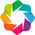

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


:Overlay
   .Image.I        :Image   [x,y]   (z)
   .Points.Probe_0 :Points   [x,y]
   .Points.Probe_1 :Points   [x,y]
   .Points.Probe_2 :Points   [x,y]
   .Points.Probe_3 :Points   [x,y]

In [ ]:
N=60
pr0 = np.array([N/3, N/3], dtype=int)      # координаты проб
pr1 = np.array([0.3*N, 2*N/3], dtype=int)
pr2 = np.array([2*N/3, 2*N/3], dtype=int)
pr3 = np.array([2*N/3, N/3], dtype=int)
hv.extension('bokeh')
img=hv.Image(N_60[4][::-1], bounds=(0, 0, N, N)).opts(width=700, height=500,colorbar=True,cmap='gnuplot2')


p0 = hv.Points([img.closest((pr0[0],pr0[1]))], label='probe 0').opts(color='#FF00FF', size=12) # отмечаем на цветовой карте пробы
p1 = hv.Points([img.closest((pr1[0],pr1[1]))], label='probe 1').opts(color='yellow', size=12) # Хочу вручную задать цвет, чтобы потом при определении периодов
                                                                                              # колебаний температуры в точке пробы, цвет графика совпадал
                                                                                              # с цветом пробы
p2 = hv.Points([img.closest((pr2[0],pr2[1]))], label='probe 2').opts(color='red', size=12)
p3 = hv.Points([img.closest((pr3[0],pr3[1]))], label='probe 3').opts(color='#00FFFF', size=12)

labels = hv.Labels({('x','y'): [pr0+[4,4],pr1+[4,4],pr2+[4,4],pr3+[4,4]],'text': ['pr 0', 'pr 1', 'pr 2', 'pr 3']},['x','y'], 'text').opts(text_font_size='14pt',text_color='white')

image = img * p0 * p1 * p2 * p3 * labels
image.opts(legend_position='left').relabel("Температурная карта в момент t=600с ")

Период в probe 0 [600.  75.]

Период в probe 1 [600.]

Период в probe 2 [600.]

Период в probe 3 [600.  75.]



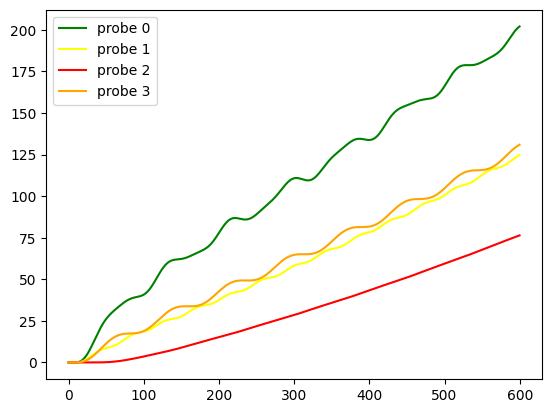

In [ ]:
time = 600
dt = 0.25
x = np.arange(0, time, dt)

# строим график температуры в пробах
plt.plot(x,N_60[0],label='probe 0', color='green')
plt.plot(x,N_60[1], label='probe 1', color='yellow')
plt.plot(x,N_60[2],label='probe 2', color='red')
plt.plot(x,N_60[3],label='probe 3', color='#00FFFF')
plt.xlabel("Прошедшее время")
plt.ylabel("Температура")
plt.legend()

t_n=0

for t in N_60[:4]:
    amp, freq = amplitude_frequency(t, dt) # Выводим амплитуду и частоту
    idx, _ = find_peaks(amp)
    print(f'Период в probe {t_n}', 1/freq[idx])
    t_n=t_n+1
    print()

## **N = 120 dt = 0.025**

In [ ]:
N_120=[]

for i in range(4): # загружаем масивы температур для N=120 dt=0.025
    N_120.append(np.load(f'N_120_dt=0.025_probe_{i}'+'.npy'))
N_120.append(np.load(f'N_120_dt=0.025_T_'+'.npy'))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
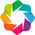

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


:Overlay
   .Image.I        :Image   [x,y]   (z)
   .Points.Probe_0 :Points   [x,y]
   .Points.Probe_1 :Points   [x,y]
   .Points.Probe_2 :Points   [x,y]
   .Points.Probe_3 :Points   [x,y]

In [ ]:
pr0 = np.array([N_arr[1]/3, N_arr[1]/3], dtype=int)
pr1 = np.array([0.3*N_arr[1]N, 2*N_arr[1]/3], dtype=int)
pr2 = np.array([2*N_arr[1]/3, 2*N_arr[1]/3], dtype=int)
pr3 = np.array([2*N_arr[1]/3, N_arr[1]/3], dtype=int)
hv.extension('bokeh')
img=hv.Image(N_120[4][::-1], bounds=(0, 0, N_arr[1], N_arr[1])).opts(width=700, height=500,colorbar=True,cmap='gnuplot2')


p0 = hv.Points([img.closest((pr0[0],pr0[1]))], label='probe 0').opts(color='#FF00FF', size=12) # отмечаем на цветовой карте пробы
p1 = hv.Points([img.closest((pr1[0],pr1[1]))], label='probe 1').opts(color='yellow', size=12) # Хочу вручную задать цвет, чтобы потом при определении периодов
                                                                                              # колебаний температуры в точке пробы, цвет графика совпадал
                                                                                              # с цветом пробы
p2 = hv.Points([img.closest((pr2[0],pr2[1]))], label='probe 2').opts(color='red', size=12)
p3 = hv.Points([img.closest((pr3[0],pr3[1]))], label='probe 3').opts(color='#00FFFF', size=12)

labels = hv.Labels({('x','y'): [pr0+[4,4],pr1+[4,4],pr2+[4,4],pr3+[4,4]],'text': ['pr 0', 'pr 1', 'pr 2', 'pr 3']},['x','y'], 'text').opts(text_font_size='14pt',text_color='white')

image = img * p0 * p1 * p2 * p3 * labels
image.opts(legend_position='left').relabel("Температурная карта в момент t=600с")

Период в probe 0 [600.  75.]

Период в probe 1 [600.          42.85714286]

Период в probe 2 [600.]

Период в probe 3 [600.  75.]



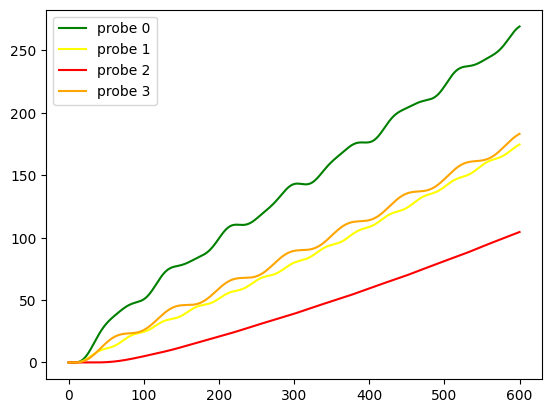

In [ ]:
time = 600
dt = 0.025
x = np.arange(0, time, dt)

# строим график температуры в пробах
plt.plot(x,N_120[0],label='probe 0', color='#FF00FF')
plt.plot(x,N_120[1], label='probe 1', color='yellow')
plt.plot(x,N_120[2],label='probe 2', color='red')
plt.plot(x,N_120[3],label='probe 3', color='#00FFFF')
plt.xlabel("Прошедшее время")
plt.ylabel("Температура")
plt.legend()

t_n=0

for t in N_120[:4]:
    amp, freq = amplitude_frequency(t, dt) # Выводим амплитуду и частоту
    idx, _ = find_peaks(amp)
    print(f'Период в probe {t_n}', 1/freq[idx])
    t_n=t_n+1
    print()

## **N = 240 dt = 0.01**

In [ ]:
N_240=[]

for i in range(4):
    N_240.append(np.load(f'N_240_dt=0.01_probe_{i}'+'.npy'))
N_240.append(np.load(f'N_240_dt=0.01_T_'+'.npy'))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
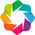

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


:Overlay
   .Image.I        :Image   [x,y]   (z)
   .Points.Probe_0 :Points   [x,y]
   .Points.Probe_1 :Points   [x,y]
   .Points.Probe_2 :Points   [x,y]
   .Points.Probe_3 :Points   [x,y]

In [ ]:
pr0 = np.array([N_arr[2]/3, N_arr[2]/3], dtype=int)
pr1 = np.array([0.3*N_arr[2], 2*N_arr[2]/3], dtype=int)
pr2 = np.array([2*N_arr[2]/3, 2*N_arr[2]/3], dtype=int)
pr3 = np.array([2*N_arr[2]/3, N_arr[2]/3], dtype=int)
hv.extension('bokeh')
img=hv.Image(N_240[4][::-1], bounds=(0, 0, N_arr[2], N_arr[2])).opts(width=700, height=500,colorbar=True,cmap='gnuplot2')


p0 = hv.Points([img.closest((pr0[0],pr0[1]))], label='probe 0').opts(color='#FF00FF', size=12, marker="o")
p1 = hv.Points([img.closest((pr1[0],pr1[1]))], label='probe 1').opts(color='yellow', size=12, marker="o")
p2 = hv.Points([img.closest((pr2[0],pr2[1]))], label='probe 2').opts(color='red', size=12, marker="o")
p3 = hv.Points([img.closest((pr3[0],pr3[1]))], label='probe 3').opts(color='#00FFFF', size=12, marker="o")

labels = hv.Labels({('x','y'): [pr0+[4,4],pr1+[4,4],pr2+[4,4],pr3+[4,4]],'text': ['pr 0', 'pr 1', 'pr 2', 'pr 3']},['x','y'], 'text').opts(text_font_size='14pt',text_color='white')

image = img * p0 * p1 * p2 * p3 * labels
image.opts(legend_position='left', fontsize=16).relabel("Температурная карта в момент t=600с")

Период в probe 0 [600.  75.]

Период в probe 1 [600.          42.85714286]

Период в probe 2 [600.]

Период в probe 3 [600.  75.]



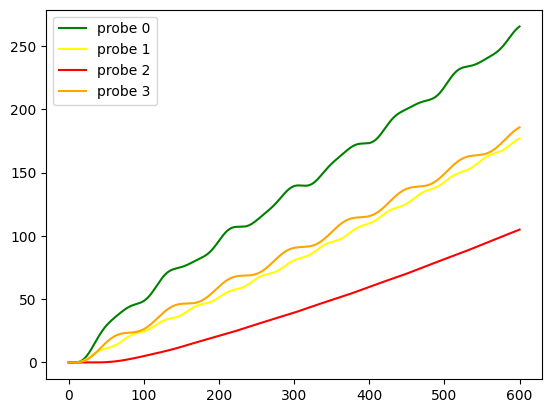

In [ ]:
time = 600
dt = 0.01
x = np.arange(0, time, dt)

# строим график температуры в пробах
plt.plot(x,N_240[0],label='probe 0', color='#FF00FF')
plt.plot(x,N_240[1], label='probe 1', color='yellow')
plt.plot(x,N_240[2],label='probe 2', color='red')
plt.plot(x,N_240[3],label='probe 3', color='#00FFFF')
plt.xlabel("Прошедшее время")
plt.ylabel("Температура")
plt.legend()

t_n=0

for t in N_240[:4]:
    amp, freq = amplitude_frequency(t, dt) # ВЫводим амплитуду и частоту
    idx, _ = find_peaks(amp)
    print(f'Период в probe {t_n}', 1/freq[idx])
    t_n=t_n+1
    print()


## **N = 480 dt = 0.001**

In [ ]:
N_480=[]

for i in range(4):
    N_480.append(np.load(f'N_480_dt=0.001_probe_{i}'+'.npy'))
N_480.append(np.load(f'N_480_dt=0.001_T_'+'.npy'))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
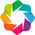

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


:Overlay
   .Image.I        :Image   [x,y]   (z)
   .Points.Probe_0 :Points   [x,y]
   .Points.Probe_1 :Points   [x,y]
   .Points.Probe_2 :Points   [x,y]
   .Points.Probe_3 :Points   [x,y]
   .Labels.I       :Labels   [x,y]   (text)

In [175]:
pr0 = np.array([N_arr[3]/3, N_arr[3]/3], dtype=int)
pr1 = np.array([0.3*N_arr[3], 2*N_arr[3]/3], dtype=int)
pr2 = np.array([2*N_arr[3]/3, 2*N_arr[3]/3], dtype=int)
pr3 = np.array([2*N_arr[3]/3, N_arr[3]/3], dtype=int)
hv.extension('bokeh')
img=hv.Image(N_480[4][::-1], bounds=(0, 0, N_arr[3], N_arr[3])).opts(width=700, height=500,colorbar=True,cmap='gnuplot2')


p0 = hv.Points([img.closest((pr0[0],pr0[1]))], label='probe 0').opts(color='#FF00FF', size=12, marker="o")
p1 = hv.Points([img.closest((pr1[0],pr1[1]))], label='probe 1').opts(color='yellow', size=12, marker="o")
p2 = hv.Points([img.closest((pr2[0],pr2[1]))], label='probe 2').opts(color='red', size=12, marker="o")
p3 = hv.Points([img.closest((pr3[0],pr3[1]))], label='probe 3').opts(color='#00FFFF', size=12, marker="o")

labels = hv.Labels({('x','y'): [[pr0[0]+4,pr0[1]+4],pr1,pr2,pr3],'text': ['pr 0', 'pr 1', 'pr 2', 'pr 3']},['x','y'], 'text').opts(text_font_size='14pt',text_color='white')

image = img * p0 * p1 * p2 * p3 * labels
image.opts(legend_position='left', fontsize=16).relabel("Температурная карта в момент t=600с")

Период в probe 0 [600.  75.]

Период в probe 1 [600.          42.85714286]

Период в probe 2 [600.]

Период в probe 3 [600.  75.]



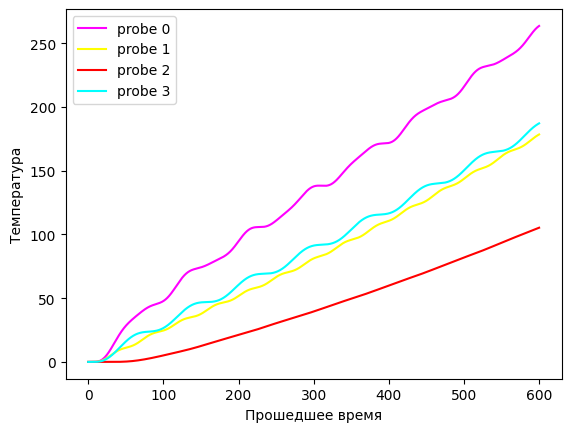

In [171]:
time = 600
dt = 0.001
x = np.arange(0, time, dt)

# строим график температуры в пробах
plt.plot(x,N_480[0],label='probe 0', color='#FF00FF')
plt.plot(x,N_480[1], label='probe 1', color='yellow')
plt.plot(x,N_480[2],label='probe 2', color='red')
plt.plot(x,N_480[3],label='probe 3', color='#00FFFF')
plt.xlabel("Прошедшее время")
plt.ylabel("Температура")
plt.legend()

t_n=0

for t in N_480[:4]:
    amp, freq = amplitude_frequency(t, dt) # ВЫводим амплитуду и частоту
    idx, _ = find_peaks(amp)
    print(f'Период в probe {t_n}', 1/freq[idx])
    t_n=t_n+1
    print()


## **N = 960 dt = 0.0005**

In [167]:
N_960=[]

for i in range(4):
    N_960.append(np.load(f'N_960_dt=0.0005_probe_{i}'+'.npy'))
N_960.append(np.load(f'N_960_dt=0.0005_T_'+'.npy'))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
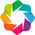

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


:Overlay
   .Image.I        :Image   [x,y]   (z)
   .Points.Probe_0 :Points   [x,y]
   .Points.Probe_1 :Points   [x,y]
   .Points.Probe_2 :Points   [x,y]
   .Points.Probe_3 :Points   [x,y]
   .Labels.I       :Labels   [x,y]   (text)

In [168]:
pr0 = np.array([N_arr[4]/3, N_arr[4]/3], dtype=int)
pr1 = np.array([0.3*N_arr[4], 2*N_arr[4]/3], dtype=int)
pr2 = np.array([2*N_arr[4]/3, 2*N_arr[4]/3], dtype=int)
pr3 = np.array([2*N_arr[4]/3, N_arr[4]/3], dtype=int)
hv.extension('bokeh')
img=hv.Image(N_960[4][::-1], bounds=(0, 0, N_arr[4], N_arr[4])).opts(width=700, height=500,colorbar=True,cmap='gnuplot2')


p0 = hv.Points([img.closest((pr0[0],pr0[1]))], label='probe 0').opts(color='#FF00FF', size=12, marker="o")
p1 = hv.Points([img.closest((pr1[0],pr1[1]))], label='probe 1').opts(color='yellow', size=12, marker="o")
p2 = hv.Points([img.closest((pr2[0],pr2[1]))], label='probe 2').opts(color='red', size=12, marker="o")
p3 = hv.Points([img.closest((pr3[0],pr3[1]))], label='probe 3').opts(color='#00FFFF', size=12, marker="o")

labels = hv.Labels({('x','y'): [pr0+[4,4],pr1+[4,4],pr2+[4,4],pr3+[4,4]],'text': ['pr 0', 'pr 1', 'pr 2', 'pr 3']},['x','y'], 'text').opts(text_font_size='14pt',text_color='white')

image = img * p0 * p1 * p2 * p3 * labels
image.opts(legend_position='left', fontsize=16).relabel("Температурная карта в момент t=600с")

Период в probe 0 [600.  75.]

Период в probe 1 [600.          42.85714286]

Период в probe 2 [600.]

Период в probe 3 [600.  75.]



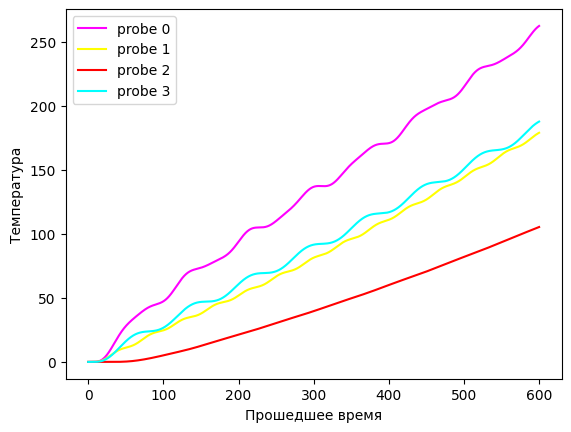

In [169]:
time = 600
dt = 0.0005
x = np.arange(0, time, dt)

# строим график температуры в пробах
plt.plot(x,N_960[0],label='probe 0', color='#FF00FF')
plt.plot(x,N_960[1], label='probe 1', color='yellow')
plt.plot(x,N_960[2],label='probe 2', color='red')
plt.plot(x,N_960[3],label='probe 3', color='#00FFFF')
plt.xlabel("Прошедшее время")
plt.ylabel("Температура")
plt.legend()

t_n=0

for t in N_960[:4]:
    amp, freq = amplitude_frequency(t, dt) # ВЫводим амплитуду и частоту
    idx, _ = find_peaks(amp)
    print(f'Период в probe {t_n}', 1/freq[idx])
    t_n=t_n+1
    print()
